In [6]:
import os 
import numpy as np
import cv2
import sys

import glob
import sqlite3

import torch
import torch.nn as nn
from torch.autograd import Variable

from netvlad import NetVLAD
import torchvision.models as models

import matplotlib.pyplot as plt
from progressbar import *

from PanoUtils.database_utils import *
from PanoUtils.BOW import *

# 1. NetVLAD image retrival

In [2]:
# encoder use vgg model
encoder_dim = 512
encoder = models.vgg16(pretrained=False)
# capture only feature part and remove last relu and maxpool
layers = list(encoder.features.children())[:-2]

# add the encoder to the model
encoder = nn.Sequential(*layers)
model = nn.Module() 
model.add_module('encoder', encoder)

# add the NetVLAD module to the model
net_vlad = NetVLAD(num_clusters=64, dim=encoder_dim, vladv2=False)
model.add_module('pool', net_vlad)

In [3]:
# Use the pretrained model from https://github.com/Nanne/pytorch-NetVlad
netvlad_pretrained_path = "vgg16_netvlad_checkpoint"
flag_file = os.path.join(netvlad_pretrained_path, 'checkpoints', 'flags.json')
model_file = os.path.join(netvlad_pretrained_path, 'checkpoints', 'checkpoint.pth.tar')
print("=> loading checkpoint '{}'".format(model_file))
checkpoint = torch.load(model_file, map_location=lambda storage, loc: storage)

start_epoch = checkpoint['epoch']
best_metric = checkpoint['best_score']
model.load_state_dict(checkpoint['state_dict'])

device = torch.device("cuda")
model = model.to(device)
model.eval()
print("=> loaded checkpoint '{}' (epoch {})".format(netvlad_pretrained_path, checkpoint['epoch']))

=> loading checkpoint 'vgg16_netvlad_checkpoint/checkpoints/checkpoint.pth.tar'
=> loaded checkpoint 'vgg16_netvlad_checkpoint' (epoch 25)


In [4]:
all_scans = glob.glob("../RGBD/garden*")
images_set = []
print("Found", len(all_scans), "scans.")
for scan_folder in all_scans:
    scan_images = glob.glob(scan_folder +"/*_r.jpg")
    scan_images.sort()
    images_set = images_set + scan_images
print("Found", len(images_set), "images.")

Found 133 scans.
Found 1197 images.


In [5]:
def netvlad_image(model, image_file, image_size = (640,480)):
    test_image = cv2.imread(image_file)
    test_image = cv2.resize(test_image, image_size)
    input_img = np.transpose(test_image, (2, 0, 1)).reshape([1,3,image_size[0],image_size[1]]).astype(np.float32)
    input_img = torch.from_numpy(input_img).to(device)
    image_encoding = model.encoder(input_img)
    vlad_encoding = model.pool(image_encoding) 
    vlad_numpy = vlad_encoding.to("cpu").detach().numpy()
    return vlad_numpy

In [6]:
database_path = "Dataset/database_netvlad.db"
conn = sqlite3.connect(database_path)
print("=> save keyframes' encoding to '{}'".format(database_path))

c = conn.cursor()
c.execute('''CREATE TABLE NETVLAD
       (FILE           TEXT    NOT NULL,
        ENCODE         BLOB);''')

progress = ProgressBar()
for i in progress(range(len(images_set))):
    text_image_path = images_set[i]
    vlad_numpy = netvlad_image(model, text_image_path)
    
    c.execute("INSERT INTO NETVLAD VALUES (?, ?)",
          (text_image_path, array_to_blob(vlad_numpy)))

conn.commit()
print("Records created successfully")
conn.close()

=> save keyframes' encoding to 'Dataset/database_netvlad.db'


100% |########################################################################|


Records created successfully


In [7]:
def match_image(database_cursor, query_encoder, topn = 5):
    best_distance = np.zeros(topn) +np.inf
    best_image = []
    for i in range(topn):
        best_image = best_image + ['']
        
    for image_file, encoding in database_cursor.execute("SELECT * FROM NETVLAD"):
        encoding_py = blob_to_array(encoding, np.float32)
        distance = query_encoder[0,:] - encoding_py
        distance = np.linalg.norm(distance)
        if(distance < np.max(best_distance)):
            idx = np.argmax(best_distance)
            best_distance[idx] = distance
            best_image[idx] = image_file
    return best_image, best_distance

In [61]:
test_images = glob.glob("test_images/*.png")
test_images.sort()

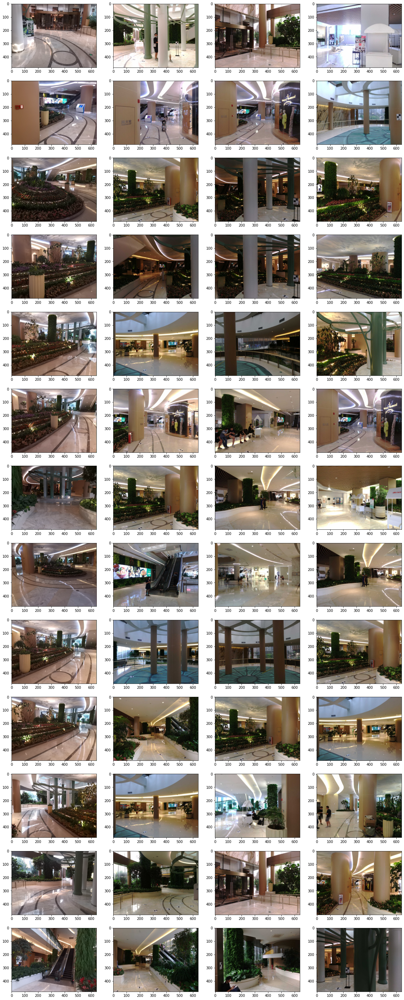

In [16]:
conn = sqlite3.connect(database_path)
c = conn.cursor()

plt.figure(figsize=(20,4*len(test_images)))

for test_idx in range(len(test_images)):
    query_encoder = netvlad_image(model, test_images[test_idx])
    best_image, best_distance = match_image(c, query_encoder, 3)

    plt.subplot(len(test_images),len(best_distance)+1,test_idx*(len(best_distance)+1)+ 1)
    plt.imshow(cv2.cvtColor(cv2.imread(test_images[test_idx]), 2))
    
    for i in range(len(best_distance)):
        plt.subplot(len(test_images),len(best_distance)+1,test_idx*(len(best_distance)+1) + i+2)
        plt.imshow(cv2.cvtColor(cv2.imread(best_image[i]),2))

conn.close()

# 2. BoW image retrival

## 2.1 Prepare Superpoint extractor

In [8]:
from pathlib import Path
import argparse
import cv2
import matplotlib.cm as cm
import torch

from SuperGluePretrainedNetwork.models.matching import Matching

In [9]:
def frame2tensor(frame, device):
    return torch.from_numpy(frame/255.).float()[None, None].to(device)

def super_point_image(image_file, device, matching):
    frame = cv2.imread(image_file)
    frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    frame_tensor = frame2tensor(frame, device)

    last_data = matching.superpoint({'image': frame_tensor})
    return last_data['keypoints'][0].cpu().detach().numpy(), last_data['scores'][0].cpu().detach().numpy(), last_data['descriptors'][0].cpu().detach().numpy()

force_cpu = False
device = 'cuda' if torch.cuda.is_available() and not force_cpu else 'cpu'
config = {
        'superpoint': {
            'nms_radius': 4,
            'keypoint_threshold': 0.005,
            'max_keypoints': -1
        },
        'superglue': {
            'weights': 'indoor',
            'sinkhorn_iterations': 20,
            'match_threshold': 0.2,
        }
    }
matching = Matching(config).eval().to(device)
keys = ['keypoints', 'scores', 'descriptors']

Loaded SuperPoint model
Loaded SuperGlue model ("indoor" weights)


## 2.2 Make the Vocabulary

In [43]:
import time

from sklearn.svm import LinearSVC
from scipy.cluster.vq import *
from sklearn.preprocessing import StandardScaler

from PanoUtils.BOW import *

In [41]:
def Des_database(database_cursor):
    FEATS = []
    for idx_kf, ref_file, kpts, scores, des in database_cursor.execute("SELECT ID,FILE,KEYPOINTS,SCORES,DESCRIPTORS FROM SUPERPANO"):        
        kpts_py = blob_to_array(kpts, np.float32, (-1,2))
        scores_py = blob_to_array(scores, np.float32, (1, -1))
        des_py = blob_to_array(des, np.float32, (256, -1))
        
        FEATS.append(des_py.transpose())
    return FEATS

In [42]:
def Des_images(image_files):
    FEATS = []
    for image in image_files:
        kpts, scores, des = super_point_image(image, device, matching)
        FEATS.append(des.transpose())
    return FEATS

In [43]:
database_path_full = "Dataset/database.db"
conn = sqlite3.connect(database_path_full)
c = conn.cursor()

K = 1024

FEATS_1 = Des_database(c)

image_files = glob.glob("/home/viki/Lucas/garden/garden_v2/images/phone/*.png")
FEATS_2 = Des_images(image_files)

FEATS = FEATS_1 + FEATS_2

feature_stack = np.vstack(FEATS)
voc, variance = kmeans(feature_stack, K, 1)
np.save("Dataset/Voc.npy", voc)

conn.close()

## 2.3 Make Index for all the database images

In [2]:
database_path_full = "Dataset/database.db"
conn = sqlite3.connect(database_path_full)
c = conn.cursor()

voc = np.load("Dataset/Voc.npy")
FEATS = MakeIndex(c, voc, "Dataset/Index.npy")

conn.close()

## 2.4 Image retrival test

In [41]:
def match_bow(database_cursor, vec_query, index, topn = 5):
    best_distance = np.zeros(topn)
    best_image = []
    for i in range(topn):
        best_image = best_image + ['']

    i = 0
    for idx_kf, image_file in database_cursor.execute("SELECT ID,FILE FROM SUPERPANO"):        
        vec_ref = index[i,:]
        i += 1
        similarity = cos_sim(vec_ref, vec_query)

        if(similarity > np.min(best_distance)):
            idx = np.argmin(best_distance)
            best_distance[idx] = similarity
            best_image[idx] = image_file
            
    sorted_distance = np.sort(best_distance)[::-1]
    sorted_order = np.argsort(best_distance)[::-1]
    sorted_image = [best_image[i] for i in sorted_order]
            
    return sorted_image, sorted_distance

In [4]:
test_images = glob.glob("test_images/*.png")
test_images.sort()

Average BoW time is 0.10594762288607083


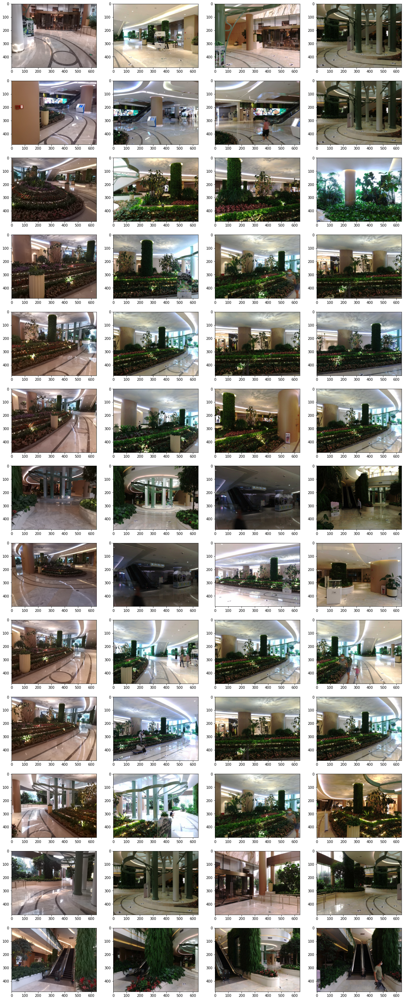

In [46]:
database_path_full = "Dataset/database.db"
conn = sqlite3.connect(database_path_full)
c = conn.cursor()

voc = np.load("Dataset/Voc.npy")
index = np.load("Dataset/Index.npy")

voc_time = 0

plt.figure(figsize=(20,4*len(test_images)))
for test_idx in range(len(test_images)):
    kpts, scores, des = super_point_image(test_images[test_idx], device, matching)
    
    tick = time.time()
    vec_query = IndexImage(voc, des.transpose())
    best_image, best_distance = match_bow(c, vec_query, index, 3)
    tock = time.time()

    voc_time = voc_time + (tock - tick)
    
    plt.subplot(len(test_images),len(best_distance)+1,test_idx*(len(best_distance)+1)+ 1)
    plt.imshow(cv2.cvtColor(cv2.imread(test_images[test_idx]), 2))
    
    for i in range(len(best_distance)):
        plt.subplot(len(test_images),len(best_distance)+1,test_idx*(len(best_distance)+1) + i+2)
        plt.imshow(cv2.cvtColor(cv2.imread(best_image[i]),2))

conn.close()
print("Average BoW time is", voc_time/len(test_images))